# Laboratorio 5: Clustering

Integrantes: Pablo Arroyo Martínez (Sección 2) // Natalia Valencia Valenzuela (Sección 2)

## Instrucciones


1. Trabajen en equipos de dos personas. Salvo excepciones, no se corregirá entregas con menos de dos integrantes.

2. Modifiquen este archivo `.ipynb` agregando sus respuestas donde corresponda.

3. Cuando finalicen el laboratorio, **generen un archivo HTML** usando jupyter y súbanlo a U-Cursos. El laboratorio debe ser entregado sólo por 1 integrante. Si se entrega por más de un integrante, se revisará cualquiera de éstos.

Para este lab trabajaremos con un dataset de texto sobre distintas noticias. Luego de procesar el texto, se realizará clustering sobre estos datos.Para este lab trabajaremos con un dataset de texto sobre  noticias de distintos temas (espacio, hockey, y computación gráfica). Luego de procesar el texto, se realizará clustering sobre estos datos.

In [1]:
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# Solo algunas categorías
categories = ['sci.space', 'rec.sport.hockey', 'comp.graphics']

newsgroups = fetch_20newsgroups(subset='train', categories=categories, remove=('headers', 'footers', 'quotes'))

texts = newsgroups.data

# TF-IDF: consideramos la cantidad de veces que aparece c/palabra y que tan
# rara es (teorema de Shannon)
vectorizer_tfidf = TfidfVectorizer(stop_words='english')
X_vec = vectorizer_tfidf.fit_transform(texts).toarray()
X = pd.DataFrame(X_vec, columns=vectorizer_tfidf.get_feature_names_out())
X

,00,000,0000,00000,000000,000005102000,000062david42,000100255pixel,00041032,0004136,...,zurbrin,zurich,zvi,zwaartepunten,zwak,zwakke,zware,zwarte,zyxel,zzzzzz
0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1772,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1773,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1774,0.000000,0.125327,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1775,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Obtuvimos un DataFrame donde cada columna representa una palabra, y su valor representa su importancia en el texto.

Hay una columna por cada posible palabra, por lo que muchos valores son 0 (matriz sparse)

## Visualizar los datos

### Pregunta 1

Nuestra matriz datos es muy dispersa (mayoría de valores en 0). Aplique PCA sobre los datos para reducirlos a solo 100 dimensiones. Visualice las primeras 2 dimensiones de los datos mediante un scatterplot.
Responda brevemente:

1. ¿Cuantos clusters cree que hay?
2. ¿Qué algoritmo de clustering podría funcionar mejor?

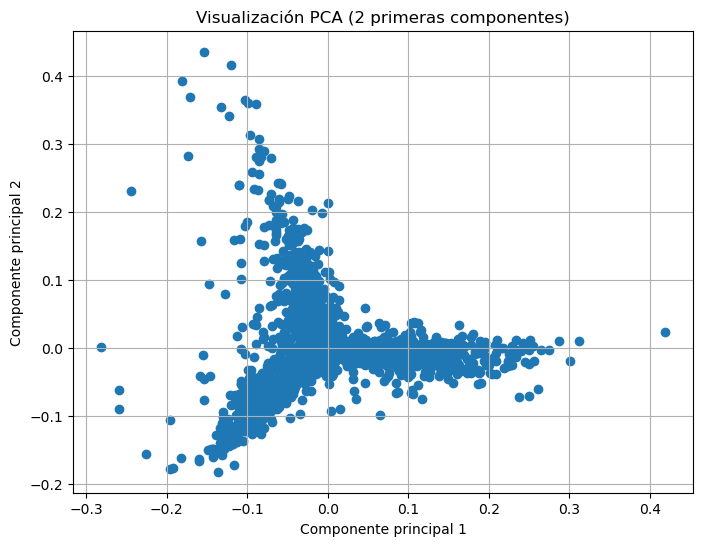

In [2]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=100)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(8,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1])
plt.title('Visualización PCA (2 primeras componentes)')
plt.xlabel('Componente principal 1')
plt.ylabel('Componente principal 2')
plt.grid(True)
plt.show()

>**Respuesta:** Viendo las ramificaciones que forman los puntos en la figura, podrían ser 3 clusters, lo cual corresponde al número de categorías seleccionadas. Como no hay presencia de estructuras esféricas, DBSCAN podría ser una buena opción, aunque considerando las densidades, podría ser una mala idea, por lo que K-means se puede usar como punto de partida.


**Nota**: Desde ahora use `X_pca` a menos que se indique lo contrario

## K-Means

El algoritmo $K$-Means divide los puntos en $K$ (definido por el usuario) grupos disjuntos $\{\mathcal{C}_1, \dots, \mathcal{C}_K\}$ minimizando la varianza intra-cluster. El criterio minimizado $G$ se denomina *inercia*:

$$
G_X(\mathcal{C}_1, \dots, \mathcal{C}_K) = \sum_{k=1}^K \sum_{i \in \mathcal{C}_k}\| \mathbf{x}_i - \mu_k \|^2_2
$$

donde $\mu_k \in \mathbb{R}^d$ son los centroides de las $K$ clases ($|\mathcal{C}_k|$ es el número de puntos en cada clase):

$$
\mu_k = \frac{1}{|\mathcal{C}_k|} \sum_{i \in \mathcal{C}_k} \mathbf{x}_i, \quad \forall k \in [K]
$$

y donde la $i$-ésima observación pertenece a la clase cuyo centroide es más cercano, es decir, $i \in \mathcal{C}_j$ si y solo si:

$$
j = \argmin_{k \in [K]} \| \mathbf{x}_i - \mu_k \|_2 = \argmin_{k \in [K]} \| \mathbf{x}_i - \mu_k \|_2^2
$$

**Nota**: en caso de empates, se resuelven aleatoriamente si es necesario.

El agrupamiento se aprende alternando iterativamente los siguientes dos pasos:

1. Un paso de asignación donde, dados los $(\mu_k)_{k=1,\dots,K}$, determinamos la etiqueta de cada punto.
2. Un paso de actualización de centroides donde, dadas las etiquetas, calculamos los centros de los clusters.

El algoritmo se detiene cuando la inercia deja de disminuir significativamente (nota: incluso sin un criterio de parada, $K$-Means terminará en un número finito de pasos; ver Banerjee et al., 2005).

La inercia es un criterio no convexo, por lo que la solución depende de la inicialización. Por eso, el algoritmo suele ejecutarse múltiples veces con diferentes inicializaciones, y se conserva la solución con la menor inercia.

### Pregunta 2

Cuando usamos K-Means debemos definir previamente el número de clusters que queremos generar. Teniendo en cuenta estos datos, implemente el método del codo, calculando el sse para el rango de 1 a 10 clusters. ¿Combinando este método y la propia intuición, cuántos clusters propone usar para este dataset? Escoja dos opciones y justifique su elección.

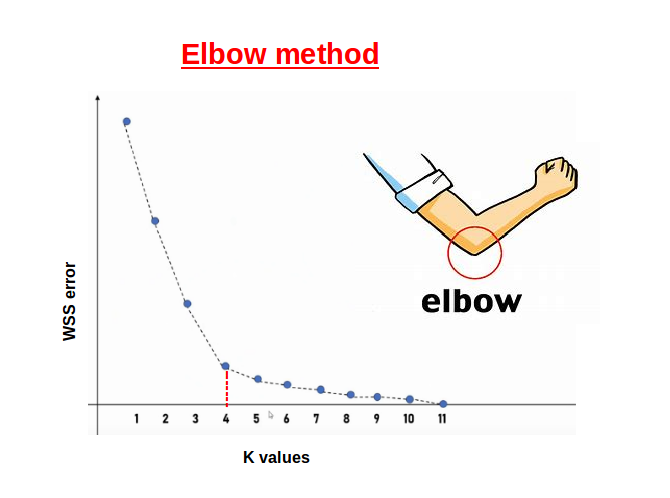

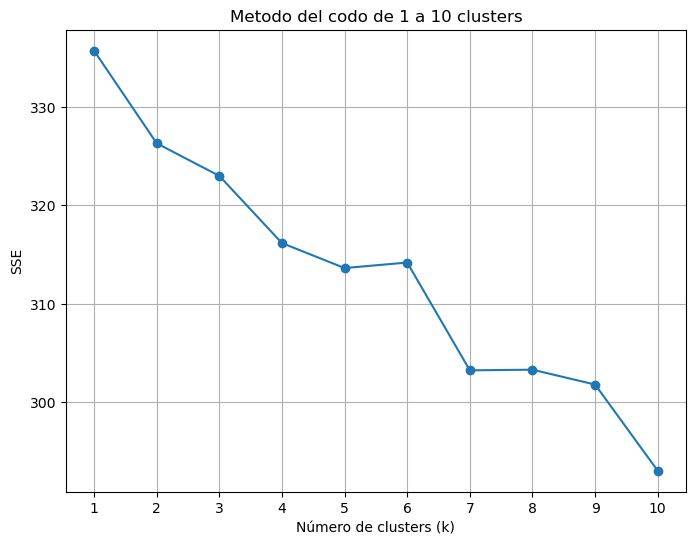

In [3]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

sse = []
clusters = list(range(1, 11))

for k in clusters:
    kmeans = KMeans(n_clusters=k).fit(X_pca)
    sse.append(kmeans.inertia_)

plt.figure(figsize=(8,6))
plt.plot(clusters, sse, marker='o')
plt.title("Metodo del codo de 1 a 10 clusters")
plt.xlabel('Número de clusters (k)')
plt.ylabel('SSE')
plt.grid(True)
plt.xticks(clusters)
plt.show()

> **Respuesta:** 3 o 6 clusters viendo el gráfico obtenido. Como se dijo antes, debido al número de categorías, 3 podría ser una cantidad correcta como número de clusters.

### Pregunta 3

 Entrene KMeans con el valor de $k$ elegido y genere un gráfico con la representación visual de los clusters (usando los datos reducidos).

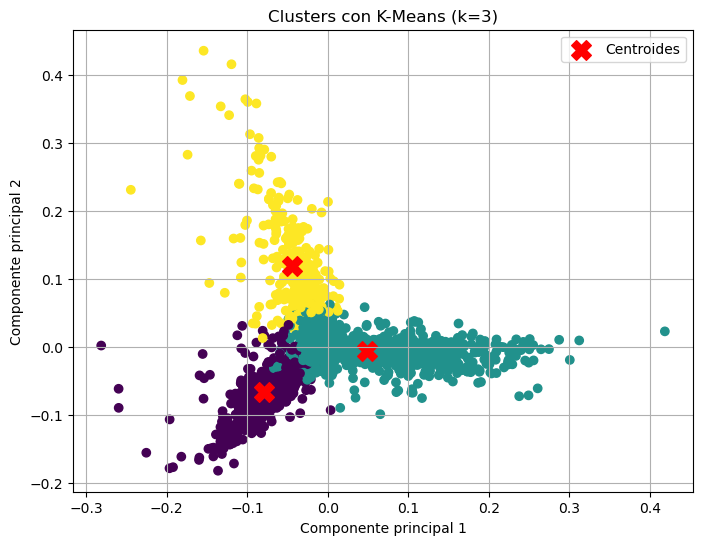

In [4]:
kmeans = KMeans(n_clusters=3)
clusters = kmeans.fit_predict(X_pca)

plt.figure(figsize=(8,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
            c='red', marker='X', s=200, label='Centroides')
plt.title('Clusters con K-Means (k=3)')
plt.xlabel('Componente principal 1')
plt.ylabel('Componente principal 2')
plt.legend()
plt.grid(True)
plt.show()

## Clustering Jerárquico

### Pregunta 4

Usando un sample de los datos, ejecute cada uno de los 4 métodos de clustering jerárquico: complete, single, average y ward, utilizando la metrica de distancia por defecto y visualice los dendrogramas formados. Adjunte el código necesario. No necesita generar los 4 dendrogramas en el mismo gráfico, pueden ser gráficos separados (individuales).

In [5]:
from scipy.cluster.hierarchy import dendrogram, linkage

X_sample = pd.DataFrame(X_pca).sample(50, random_state=0) # utilice solo un sample de los datos

complete = linkage(X_sample, method="complete")    # Vista en clase como MAX
single = linkage(X_sample, method="single")        # Vista en clase como MIN
average = linkage(X_sample, method="average")
ward = linkage(X_sample, method="ward")

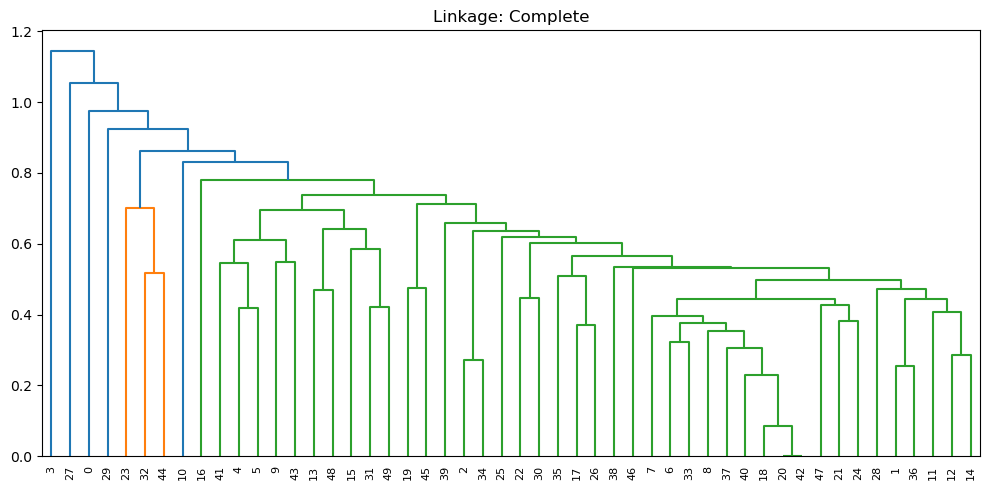

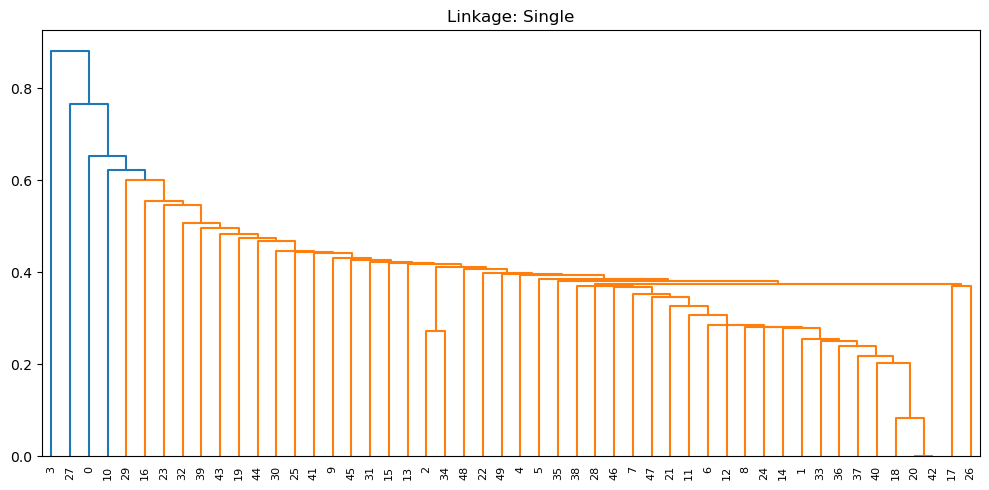

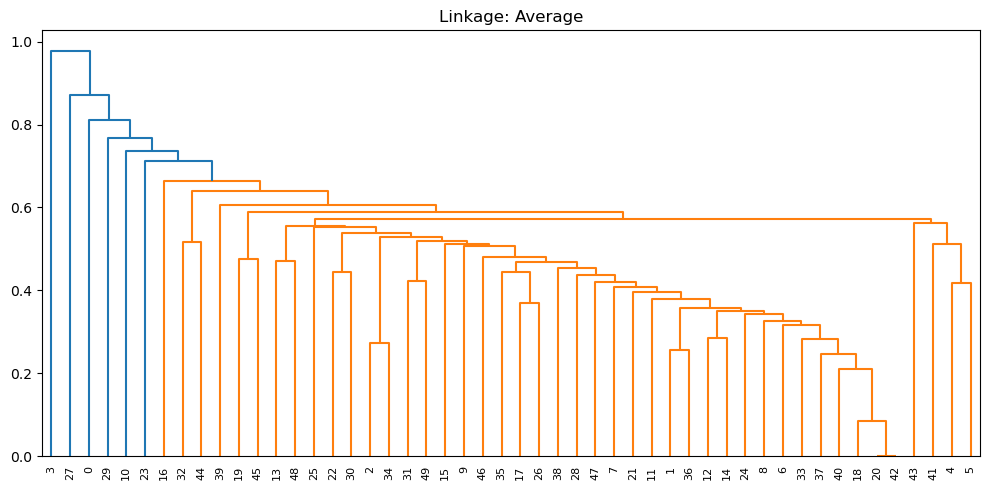

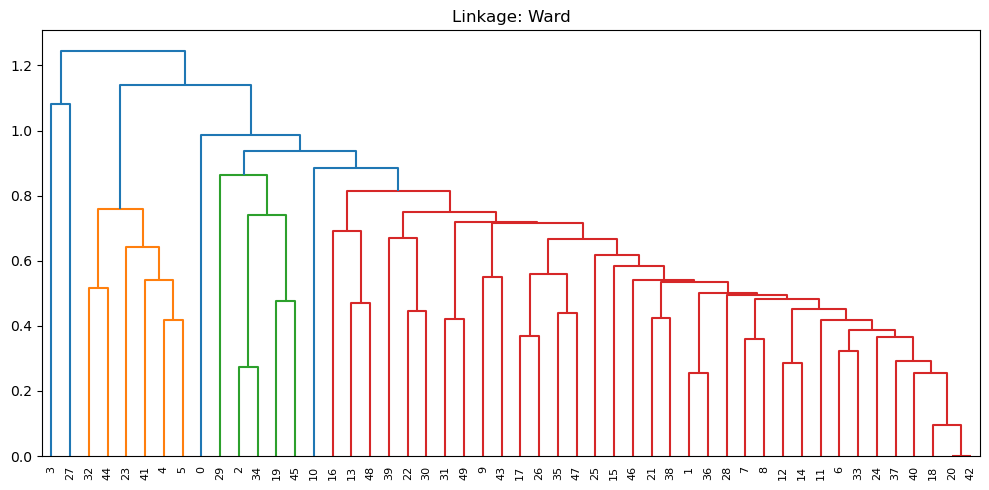

In [6]:
methods = ['complete', 'single', 'average', 'ward']

for method in methods:
    linked = linkage(X_sample, method=method)

    plt.figure(figsize=(10, 5))
    dendrogram(linked)
    plt.title(f'Linkage: {method.capitalize()}')
    plt.tight_layout()
    plt.show()

### Pregunta 5

Vuelva a ejecutar el dendograma para el método `ward`, pero con el conjunto X completo. ¿"Visualmente" cuántos clusters propone usar? ¿A qué altura recomendaría cortar el árbol?

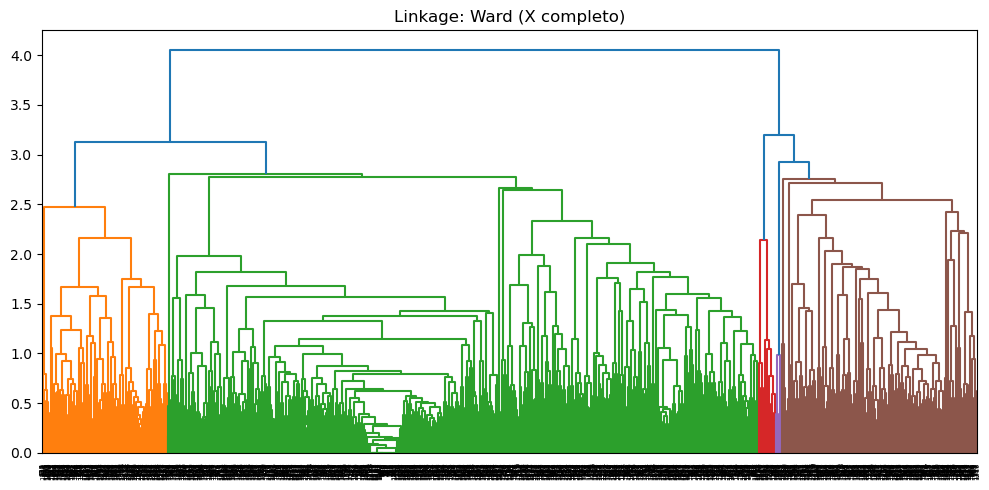

In [7]:
ward_full = linkage(X_pca, method="ward")

plt.figure(figsize=(10, 5))
dendrogram(ward_full)
plt.title(f'Linkage: Ward (X completo)')
plt.tight_layout()
plt.show()

> **Respuesta:** 4 clusters. Altura cercana a 3, con tal de diferenciar los clusters mas notorios en el dendrograma.


### Pregunta 6

 Implemente el código para asignar clusters a los datos siguiendo lo que usted la áltura de corte que propuso en la pregunta anterior. Señale cuántos clusters se generan. Luego, usando el dataset con dimensiones reducidas generado con PCA, grafique los datos y píntelos con su asignacion de clusters.

Número de clusters generados con corte en altura 3.0: 4


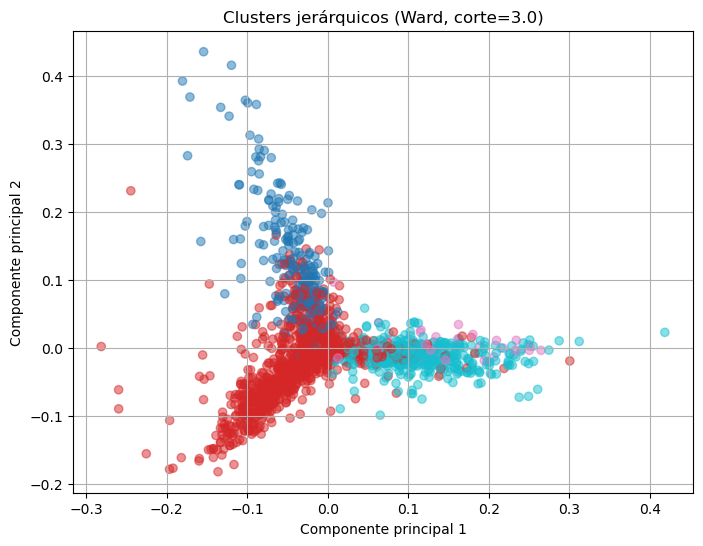

In [8]:
from scipy.cluster.hierarchy import fcluster
import numpy as np

corte = 3.0

ward_labels = fcluster(ward_full, t=corte, criterion='distance')

num_clusters = len(np.unique(ward_labels))
print(f"Número de clusters generados con corte en altura {corte}: {num_clusters}")

plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=ward_labels, cmap='tab10', alpha=0.5)
plt.title(f'Clusters jerárquicos (Ward, corte={corte})')
plt.xlabel('Componente principal 1')
plt.ylabel('Componente principal 2')
plt.grid(True)
plt.show()

## DBSCAN

Ahora probaremos hacer el clustering con el método DBSCAN.


### Pregunta 7

Explique el funcionamiento general del método de DBSCAN e indique que rol juegan los parámetros min_samples y eps.

>**Respuesta:** DBSCAN es un algoritmo de clustering basado en densidad que es útil para encontrar grupos de forma arbitraria y detectar outliers. No requiere predefinir el número de clusters como K-Means y es especialmente útil cuando los clusters no son esféricos o tienen densidades variables. El parámetro min_samples indica la cantidad de puntos que estan dentro de una distancia epsilon, y esa distancia es el valor del parámetro eps.

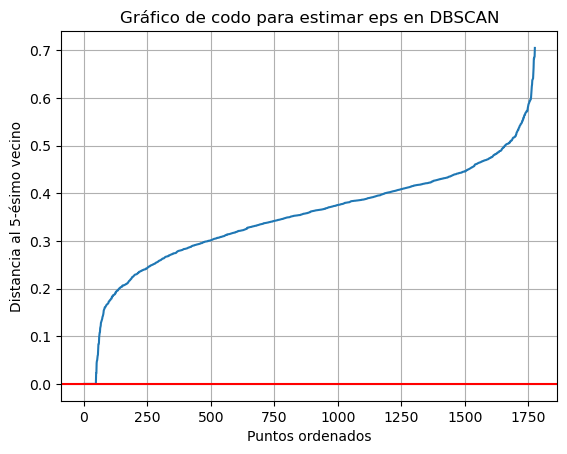

In [9]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

k = 5  # usado como min_samples en DBSCAN
neighbors = NearestNeighbors(n_neighbors=k)
neighbors_fit = neighbors.fit(X_pca)
distances, _ = neighbors_fit.kneighbors(X_pca)
k_distances = np.sort(distances[:, k-1]) # Ordenar las distancias al k-ésimo vecino

plt.plot(k_distances)
# TODO: elija el valor de y
plt.axhline(y=0, color='r')
plt.ylabel(f'Distancia al {k}-ésimo vecino')
plt.xlabel('Puntos ordenados')
plt.title('Gráfico de codo para estimar eps en DBSCAN')
plt.grid(True)
plt.show()

Ejecute la siguiente celda que implementa el método de DBSCAN:

4 clusters


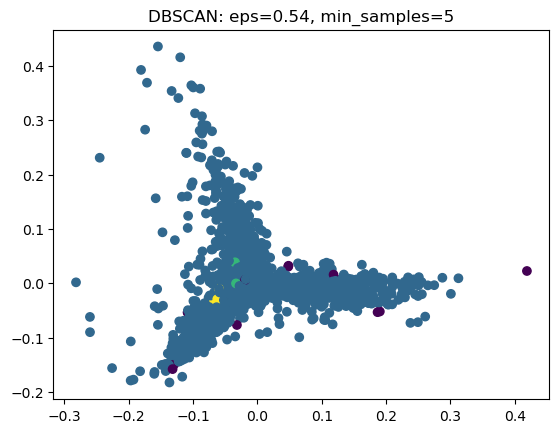

In [10]:
from sklearn.cluster import DBSCAN

#Pauta
eps = 0.54
min_samples = 5

dbscan = DBSCAN(eps=eps, min_samples=min_samples).fit(X_pca)

print(len(np.unique(dbscan.labels_) - 1), "clusters")

scatter = plt.scatter(X_pca[:,0], X_pca[:,1], c=dbscan.labels_)
plt.title(f"DBSCAN: eps={eps}, min_samples={min_samples}")
plt.show()

¿Es una buena idea usar DBSCAN en este caso? Justifique

>**Respuesta:** Al observar el gráfico, se ve que al usar DBSCAN no se obtienen clusters bien definidos, y esto sucede debido a la densidad que encontramos en la distribución de los puntos. Casi todos los puntos cumplen con ese epsilon y se integran en un mismo cluster, haciendo que se tenga como resultado un cluster con casi la totalidad de los puntos.

## Evaluación

### Pregunta 8

Complete la función que dado los labels de los clusters, imprima las 15 palabras más importantes de cada uno.

In [11]:
def palabras_caracteristicas(X, labels):
    df = X.copy()
    df['cluster'] = labels

    for id in np.unique(labels):
        print(f"\nCluster {id}:")

        df_cluster = df[df['cluster'] == id].drop(columns='cluster')
        mean = df_cluster.mean()

        top_palabras = mean.sort_values(ascending=False).head(15)

        print(top_palabras.index.tolist())

In [12]:
print("KMeans:")
palabras_caracteristicas(X, kmeans.labels_)
print("\nWard:")
palabras_caracteristicas(X, ward_labels)
print("\nDBSCAN:")
palabras_caracteristicas(X, dbscan.labels_)

KMeans:

Cluster 0:
['thanks', 'graphics', 'files', 'image', 'file', 'know', 'program', 'looking', 'help', 'hi', 'does', 'windows', 'use', 'software', 'need']

Cluster 1:
['game', 'team', 'hockey', 'just', 'think', 'don', 'like', 'play', 'games', 'season', 'players', 'year', 'good', 'time', 'nhl']

Cluster 2:
['space', 'nasa', 'launch', 'moon', 'shuttle', 'people', 'orbit', 'lunar', 'earth', 'just', 'like', 'think', 'data', 'station', 'cost']

Ward:

Cluster 1:
['space', 'nasa', 'launch', 'moon', 'lunar', 'shuttle', 'orbit', 'cost', 'like', 'just', 'station', 'people', 'earth', 'dc', 'government']

Cluster 2:
['thanks', 'graphics', 'know', 'like', 'does', 'don', 'just', 'think', 'files', 'need', 'image', 'software', 'program', 'file', 'use']

Cluster 3:
['pts', '10', 'period', '11', 'pp', '12', '55', 'scorer', '25', '18', '17', '13', '14', '19', '16']

Cluster 4:
['game', 'team', 'hockey', 'games', 'play', 'players', 'season', 'year', 'nhl', 'league', 'detroit', 'leafs', 'espn', 'like'

### Pregunta 9

El coeficiente de Silhouette cuantifica la cohesión y separación de un punto al calcular el cociente entre la distancia promedio a los puntos del mismo cluster y la distancia promedio al otro clusters más cercano

Para cada uno de los experimentos (los dos de la parte de `KMeans`, el con el método `Ward` en la parte de clustering jerárquico y el con `DBSCAN`), adjunte el código que permita obtener el Silhouette score de los modelos.

In [13]:
from sklearn.metrics import silhouette_score

silhouette_kmeans_3 = silhouette_score(X_pca, kmeans.labels_)
print(f"Silhouette Score - KMeans (k=3): {silhouette_kmeans_3:.3f}")

silhouette_ward = silhouette_score(X_pca, ward_labels)
print(f"Silhouette Score - Ward: {silhouette_ward:.3f}")

silhouette_dbscan = silhouette_score(X_pca, dbscan.labels_)
print(f"Silhouette Score - DBSCAN: {silhouette_dbscan:.3f}")


Silhouette Score - KMeans (k=3): 0.022
Silhouette Score - Ward: 0.030
Silhouette Score - DBSCAN: 0.300


En base a las palabras importantes de los clusters definidos por los modelos, y sus coeficientes de Sihlouette, ¿cuál cree que es el que da mejores clusters? Comente al respecto basándose principalmente en los resultados.

> **Respuesta:** DBSCAN es el mejor método si nos guiamos principalmente por el Silhouette score. Sin embargo, KMeans o Ward podrían ser preferibles si queremos interpretar clusters amplios y temáticos, ya que generan grupos más generales.

## (BONUS) ¿Cómo podemos mejorar los resultados?

Hasta ahora solo hemos trabajado con la aparición de las palabras en los textos, pero no hemos incorporado representaciones de la semántica de las palabras. Para esto, usaremos representaciones de un Modelo de Lenguaje, a través de la librería [BERTopic](https://maartengr.github.io/BERTopic/index.html)

Use la librería para generar un cluster basado en K-Means con 3 clusters, y vizualizar el resultado

In [14]:
#!pip install bertopic

In [15]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import re
## Eliminar términos frecuentes como conectores, preposiciones, ...
def clean_text(text):
    text = text.lower()
    text = re.sub(r"\W+", " ", text)  # eliminar puntuación
    text = re.sub(r"\d+", " ", text)  # eliminar números
    words = text.split()
    words = [w for w in words if w not in ENGLISH_STOP_WORDS]
    return " ".join(words)

cleaned_news = [clean_text(doc) for doc in texts[0:300]]

In [19]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = sentence_model.encode(cleaned_news)

topic_model = BERTopic(hdbscan_model=kmeans).fit(cleaned_news, embeddings)


In [17]:
topic_model.visualize_documents(cleaned_news, embeddings=embeddings)

# Por qué no aparece nada? xD. Usando de referencia https://maartengr.github.io/BERTopic/getting_started/visualization/visualization.html

## Aplicación a la Compresión de Imágenes

Los algoritmos de clustering también pueden utilizarse para cuantización vectorial. En una imagen a color, cada píxel se codifica con 3 valores (rojo, verde y azul - RGB), cada uno codificado como un byte (entero entre 0 y 255).

La idea de la cuantización vectorial es codificar cada píxel usando solo $K$ colores, donde $K$ es mucho menor que los $256^3$ valores posibles. Así, la imagen puede almacenarse de forma más compacta.

### Preguntas

9. Aplica el algoritmo $K$-Medias para reducir el número de niveles de color en una imagen a $K=32$ valores. Muestra el resultado como una imagen. ¿A partir de qué valor de $K$ dejamos de ver diferencia con la imagen original?

Para usar tus estimadores, necesitarás redimensionar (reshape) la imagen para trabajar con un array bidimensional de tamaño número de píxeles por tres, ya que hay tres colores en la codificación RGB.



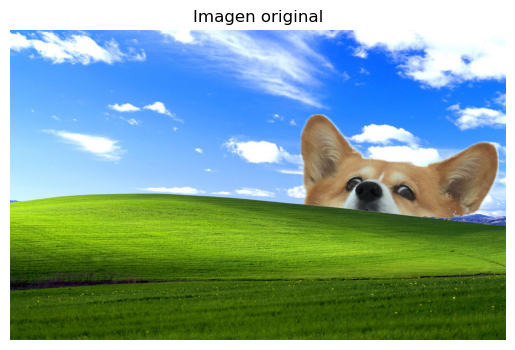

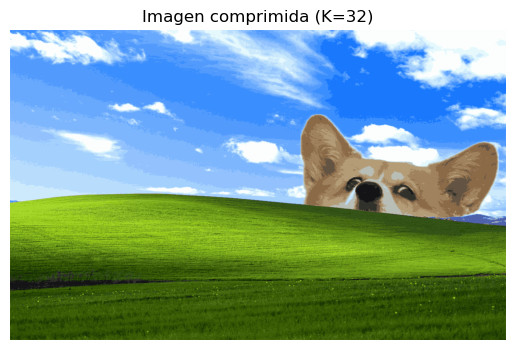

In [18]:
# Leer y mostrar la imagen original
img = plt.imread('image.jpg')
plt.imshow(img)
plt.title("Imagen original")
plt.axis('off')
plt.show()

original_shape = img.shape
img_reshaped = img.reshape(-1, 3)

n_clusters = 32  # Se deja de ver diferencias con un k cercano a 64 (Aunque depende de la visión de uno xD)
kmeans = KMeans(n_clusters=n_clusters)
kmeans.fit(img_reshaped)

labels = kmeans.labels_
centers = kmeans.cluster_centers_

compressed_img = centers[labels].reshape(original_shape)

plt.imshow(compressed_img / 255)
plt.title(f"Imagen comprimida (K={n_clusters})")
plt.axis('off')
plt.show()